# Plot 2D Climatology and Bias Maps

Compare climatology maps from any set of standalone `PCMDIRun` inputs. Shared cells define the resolver and plotting workflow; the final cell selects the runs.


In [28]:
from pathlib import Path
import importlib
import sys

PROJECT_ROOT = next(
    (path for path in [Path.cwd().resolve(), *Path.cwd().resolve().parents]
     if (path / "scripts").is_dir()),
    None,
)
if PROJECT_ROOT is None:
    raise FileNotFoundError("Could not find the repository scripts directory.")

SCRIPTS_DIR = PROJECT_ROOT / "scripts"
if str(SCRIPTS_DIR) not in sys.path:
    sys.path.insert(0, str(SCRIPTS_DIR))

import climatology_2d_map
import pcmdi_climo_reader
importlib.reload(climatology_2d_map)
importlib.reload(pcmdi_climo_reader)

from climatology_2d_map import (
    plot_bias_only_comparison,
    plot_climatology_comparison,
)
from metrics_group_merger import PCMDIRun
from pcmdi_climo_reader import (
    resolve_climatology_runs,
    validate_climatology_inputs,
)


In [29]:
# Shared workflow configuration.
CLIM_DEFAULT_FIG_DIR = PROJECT_ROOT / "figure_data" / "clim_bias_map"
CLIM_RUN_TYPE = "model_vs_obs"
CLIM_STRICT_PATHS = False

CLIM_VARIABLES = ["tas", "pr", "psl"]

# Use "OBS" for variable-specific observations, or use one run's output_name
# to make all bias maps relative to that model.
CLIM_DEFAULT_REF_NAME = "OBS"
CLIM_DEFAULT_INCLUDE_REFERENCE = True
CLIM_DEFAULT_REFERENCE_LABELS = {
    "tas": "ERA5",
    "pr": "GPCP_v2_3",
    "psl": "ERA5",
}
CLIM_METRIC_BOX_ALPHA = 0.45
CLIM_PANEL_LAYOUT = "season_rows"

# Plot appearance controls.
CLIM_MAP_FONT_SIZE = 16
CLIM_MAP_FIG_SIZE = (24, 20)
CLIM_MAP_DPI = 300

CLIM_GRID_KWARGS = {
    "left": 0.05,
    "right": 0.95,
    "top": 0.93,
    "bottom": 0.07,
    "wspace": 0.12,
    "hspace": 0.08,
}

CLIM_BIAS_FONT_SIZE = 14
CLIM_BIAS_FIG_SIZE = (19, 14)
CLIM_BIAS_DPI = 150
CLIM_BIAS_SHOW_BORDERS = False
CLIM_BIAS_COLORBAR_WIDTH = 0.045
CLIM_BIAS_LONGITUDE_LABELS = [-160, -80, 0, 80, 160]
CLIM_BIAS_TITLE_PAD = 3
CLIM_BIAS_SUPTITLE_Y = 0.985
CLIM_BIAS_GRID_KWARGS = {
    "left": 0.05,
    "right": 0.93,
    "top": 0.88,
    "bottom": 0.07,
    "wspace": 0.02,
    "hspace": 0.24,
}

# Roots used to resolve InputClimatologyFileName and References/default/file_path from metric JSONs.
# Add the directory that contains climo files if the summary below reports unresolved paths.
CLIM_DEFAULT_SEARCH_ROOTS = [
    Path("/global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi"),
    Path("/global/cfs/cdirs/e3sm/diagnostics/pcmdi_data"),
    Path("/pscratch/sd/z/zhan391/e3smv4_project/diag_out"),
]

# Optional per-model roots, useful when climo files are stored outside the raw PCMDI run directory.
# Example workflows pass their own output_name-keyed mappings when needed.
CLIM_DEFAULT_SEARCH_ROOTS_BY_MODEL = {
    # "v3.HR.CPL": [Path("/path/to/v3.HR.CPL/mean_climate")],
    # "v4P.CPL": [Path("/path/to/v4P.CPL/mean_climate")],
    # "v4P.AMIP": [Path("/path/to/v4P.AMIP/mean_climate")],
}

CLIM_VARIABLE_UNITS = {
    "tas": "tas (K)",
    "pr": "pr (mm day$^{-1}$)",
    "psl": "psl (hPa)",
}

CLIM_VARIABLE_SCALE_FACTORS = {
    # Unit-aware precipitation conversion is handled by ClimatologyMapPlotter.
}

CLIM_VAR_LEVELS = {
    "default": {
        "raw_levels": None,
        "diff_levels": None,
        "cmap_raw": "viridis",
        "cmap_diff": "RdBu_r",
    },
    "tas": {
        "raw_levels": None,
        "diff_levels": [-15, -10, -5, -2, -1, -0.5,-0.2, 0.2, 0.5, 1, 2, 5, 10, 15],
        "cmap_raw": "YlOrRd",
        "cmap_diff": "RdBu_r",
    },
    "pr": {
        "raw_levels": None,
        "diff_levels": [-6, -4, -2, -1, -0.5, -0.2, 0.2, 0.5, 1, 2, 4, 6],
        "cmap_raw": "YlGnBu",
        "cmap_diff": "BrBG",
    },
    "psl": {
        "raw_levels": None,
        "diff_levels": [-16, -12, -8, -5, -3, -2, -1, -0.5, 0.5, 1, 2, 3, 5, 8, 12, 16],
        "cmap_raw": "YlOrBr",
        "cmap_diff": "PiYG",
    },
}


Resolved climatology files:
  LR
    tas: /lcrc/group/e3sm2/ac.qtang/E3SMv3/v3.LR.amip_0101/post/atm/180x360_aave/clim/30yr
    pr: /lcrc/group/e3sm2/ac.qtang/E3SMv3/v3.LR.amip_0101/post/atm/180x360_aave/clim/30yr
    psl: /lcrc/group/e3sm2/ac.qtang/E3SMv3/v3.LR.amip_0101/post/atm/180x360_aave/clim/30yr
  NARRM
    tas: /lcrc/group/e3sm2/ac.qtang/E3SMv3/v3.NARRM.amip_0101/post/atm/180x360_aave/clim/30yr
    pr: /lcrc/group/e3sm2/ac.qtang/E3SMv3/v3.NARRM.amip_0101/post/atm/180x360_aave/clim/30yr
    psl: /lcrc/group/e3sm2/ac.qtang/E3SMv3/v3.NARRM.amip_0101/post/atm/180x360_aave/clim/30yr
  NARRM_r0125
    tas: /lcrc/group/e3sm2/ac.qtang/E3SMv3/v3.NARRM_r0125.amip_0101/post/atm/180x360_aave/clim/30yr
    pr: /lcrc/group/e3sm2/ac.qtang/E3SMv3/v3.NARRM_r0125.amip_0101/post/atm/180x360_aave/clim/30yr
    psl: /lcrc/group/e3sm2/ac.qtang/E3SMv3/v3.NARRM_r0125.amip_0101/post/atm/180x360_aave/clim/30yr
  EARRM
    tas: /lcrc/group/e3sm2/ac.qtang/E3SMv3/v3.EARRM.amip_0101/post/atm/180x360_aave/c

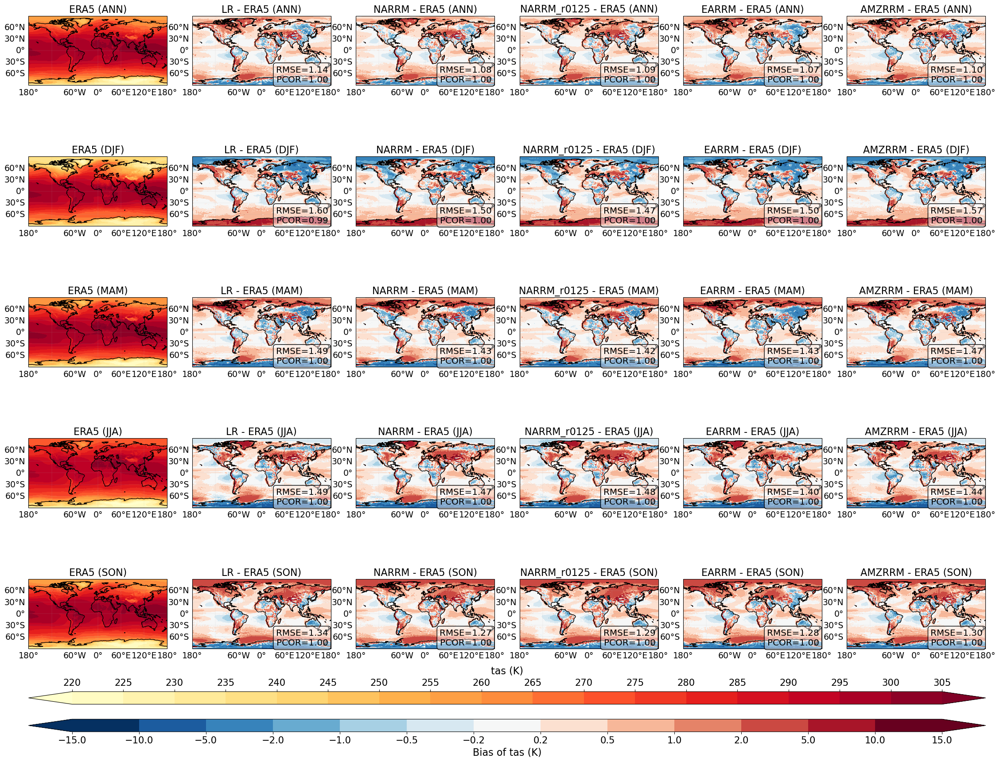

[INFO] Saved /lcrc/group/e3sm/public_html/diagnostic_output/ac.szhang/v3rrm_paper/climatology_bias_grid_pr.png


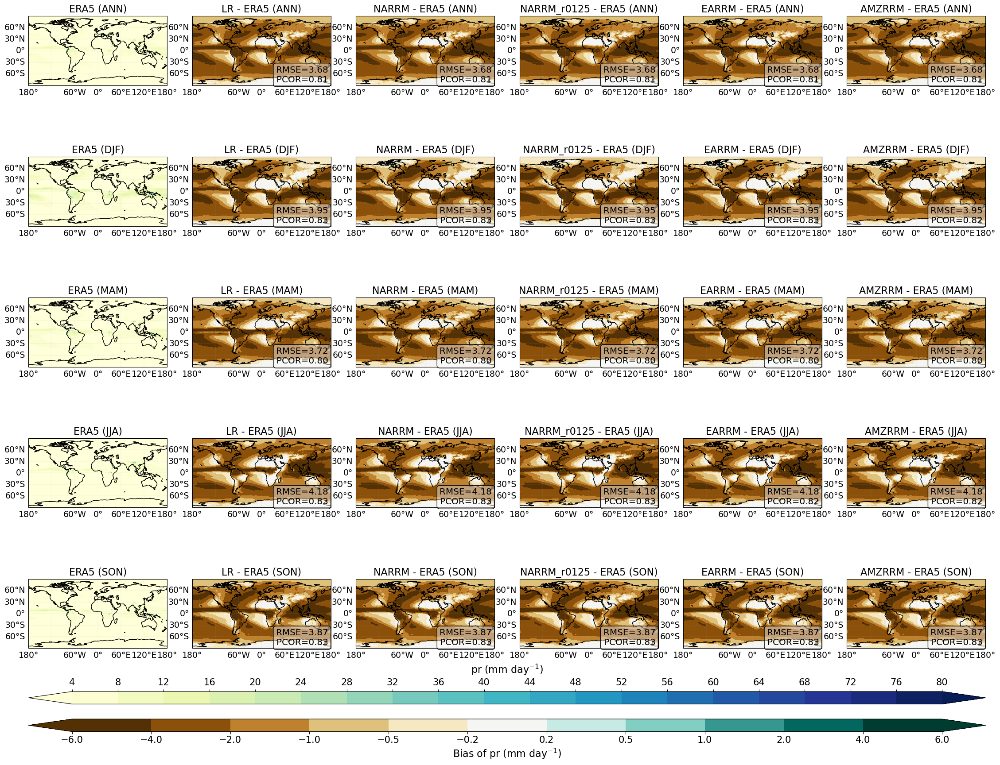

[INFO] Saved /lcrc/group/e3sm/public_html/diagnostic_output/ac.szhang/v3rrm_paper/climatology_bias_grid_psl.png


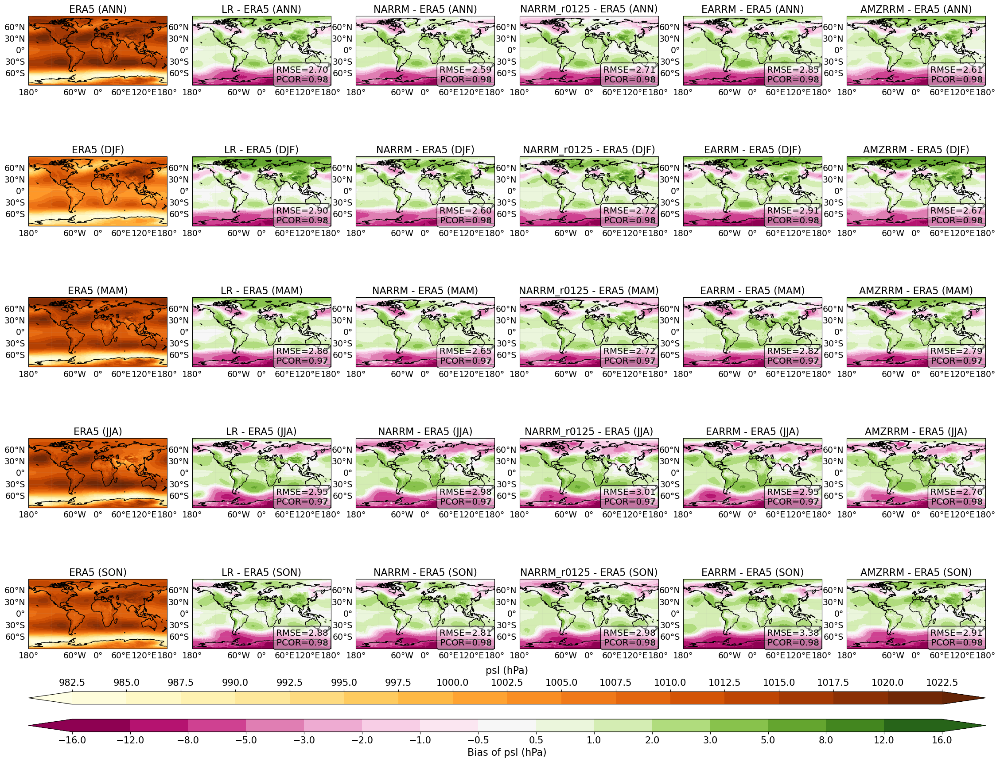

[INFO] Saved /lcrc/group/e3sm/public_html/diagnostic_output/ac.szhang/v3rrm_paper/climatology_bias_only_tas.png


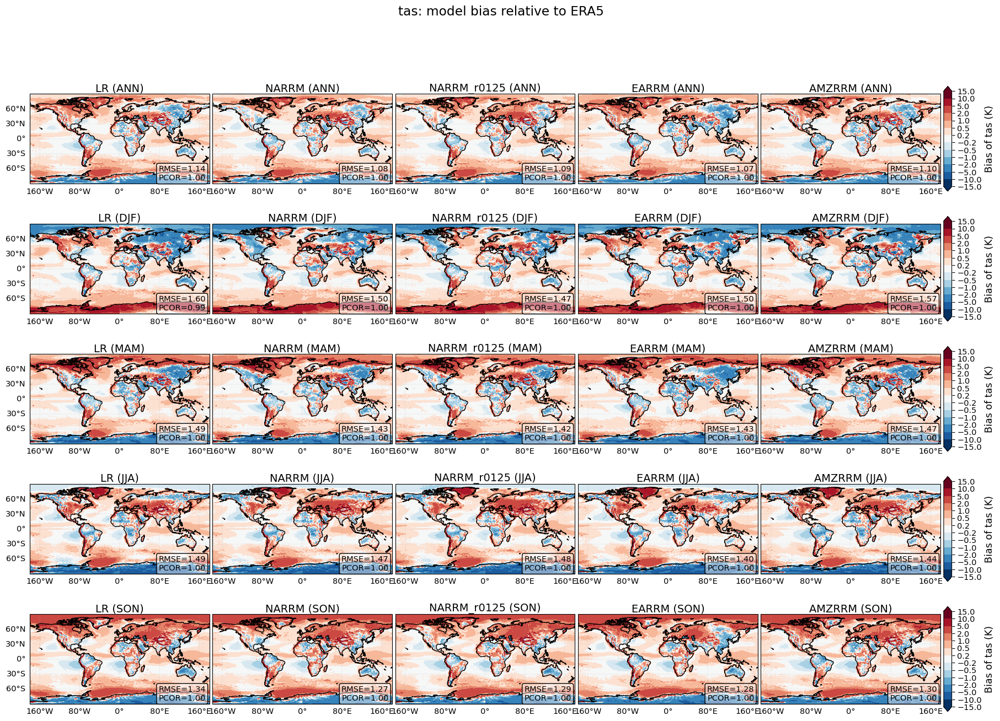

[INFO] Saved /lcrc/group/e3sm/public_html/diagnostic_output/ac.szhang/v3rrm_paper/climatology_bias_only_pr.png


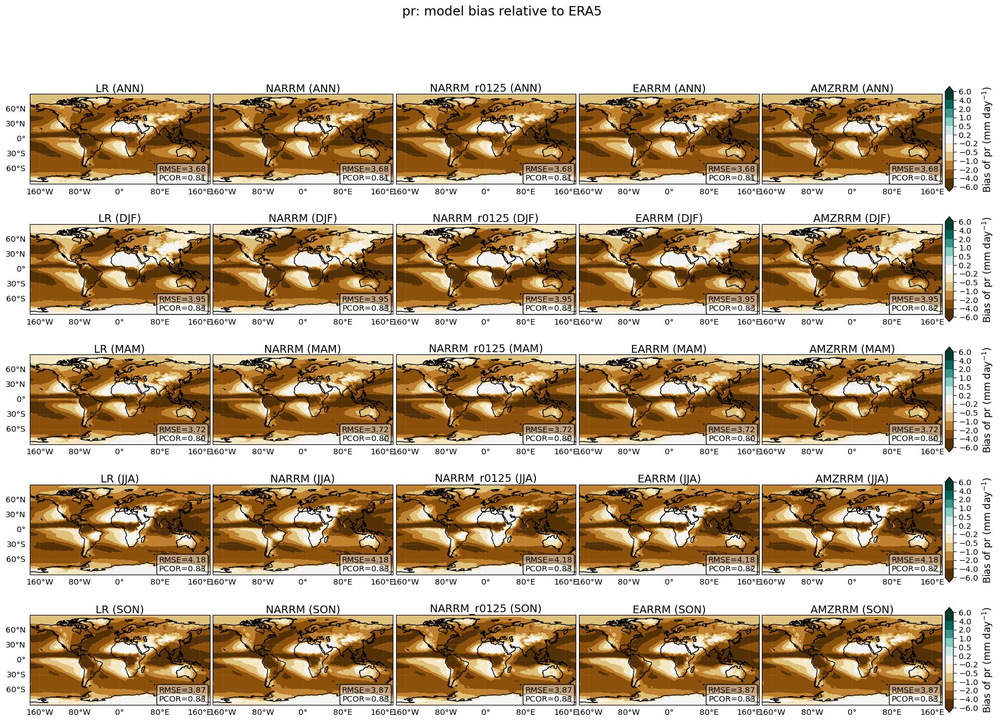

[INFO] Saved /lcrc/group/e3sm/public_html/diagnostic_output/ac.szhang/v3rrm_paper/climatology_bias_only_psl.png


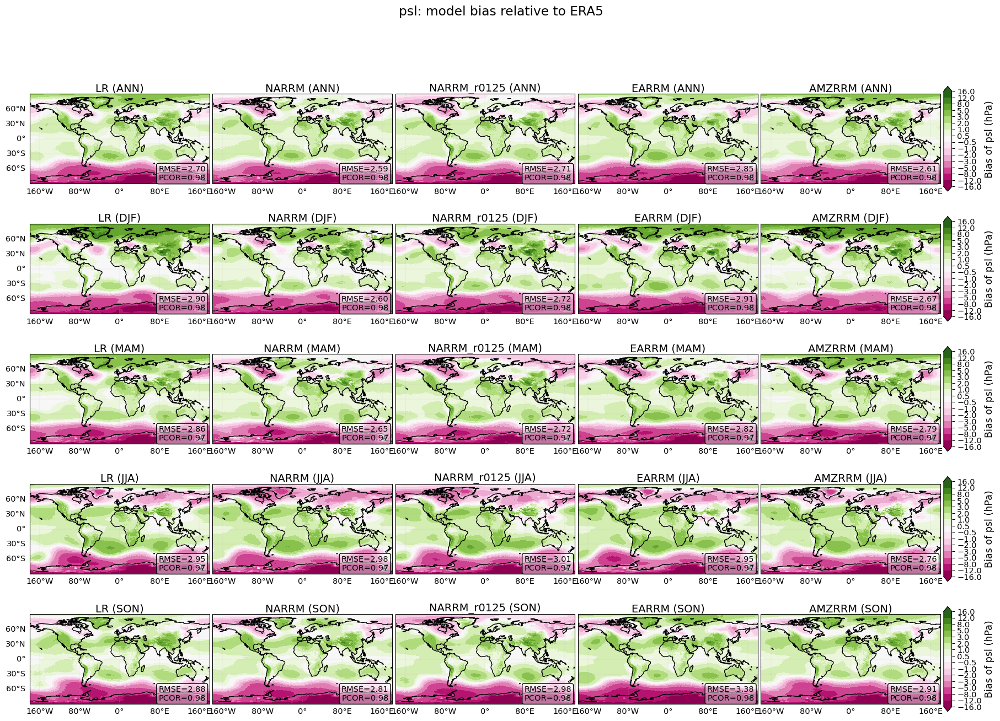

In [30]:
# Standalone v3 RRM PCMDI comparison (kept at the end so shared cells stay reusable).
RRM_TOP_DIR = Path(
    "/lcrc/group/e3sm/ac.szhang/acme_scratch/e3sm_project/v3_rrm_paper"
)
RRM_DATA_DIR = Path(
    "/lcrc/group/e3sm/public_html/diagnostic_output/ac.szhang/e3sm-pcmdi"
)
RRM_FIG_DIR = Path(
    "/lcrc/group/e3sm/public_html/diagnostic_output/ac.szhang/v3rrm_paper"
)
RRM_PERIOD = (1985, 2014)  # The period represented by these precomputed climatologies.

RRM_MODELS = [
    "v3.LR.amip_0101",
    "v3.NARRM.amip_0101",
    "v3.NARRM_r0125.amip_0101",
    "v3.EARRM.amip_0101",
    "v3.AMZRRM.amip_0101",
]
RRM_MODEL_LABELS = ["LR", "NARRM", "NARRM_r0125", "EARRM", "AMZRRM"]
RRM_PCMDI_MODEL_NAMES = [
    "v3-LR_0101",
    "v3-NARRM_0101",
    "v3-NARRM-r0125_0101",
    "v3-EARRM_0101",
    "v3-AMZRRM_0101",
]
RRM_METRICS_CASE_ID = "v20260212"
RRM_MODEL_DATA_ROOT = Path("/lcrc/group/e3sm2/ac.qtang/E3SMv3")

RRM_RUN_PLOTS = True
RRM_ERA5_CLIMO_DIR = Path(
    "/lcrc/group/e3sm/diagnostics/observations/Atm/climatology/ERA5"
)
RRM_REF_NAME = "ERA5"
RRM_INCLUDE_REFERENCE = False
RRM_REFERENCE_LABELS = {variable: RRM_REF_NAME for variable in CLIM_VARIABLES}
RRM_SEARCH_ROOTS_BY_MODEL = {
    label: [
        RRM_MODEL_DATA_ROOT / case / "post" / "atm" / "180x360_aave" / "clim" / "30yr"
    ]
    for case, label in zip(RRM_MODELS, RRM_MODEL_LABELS)
}

RRM_COMPARISON_RUNS = [
    PCMDIRun(
        case=case,
        model_name=model_name,
        metrics_case_id=RRM_METRICS_CASE_ID,
        output_name=label,
        www=RRM_DATA_DIR,
    )
    for case, model_name, label in zip(RRM_MODELS, RRM_PCMDI_MODEL_NAMES, RRM_MODEL_LABELS)
]

# Search the RRM project and PCMDI output trees in addition to the shared roots.
RRM_SEARCH_ROOTS = [RRM_DATA_DIR, RRM_TOP_DIR / "figure_data"]
RRM_ERA5_EXPERIMENT = {
    RRM_REF_NAME: {variable: RRM_ERA5_CLIMO_DIR for variable in CLIM_VARIABLES}
}
RRM_EXPERIMENTS = resolve_climatology_runs(
    RRM_COMPARISON_RUNS,
    CLIM_VARIABLES,
    run_type=CLIM_RUN_TYPE,
    ref_name=RRM_REF_NAME,
    include_reference=RRM_INCLUDE_REFERENCE,
    search_roots=RRM_SEARCH_ROOTS,
    search_roots_by_model=RRM_SEARCH_ROOTS_BY_MODEL,
    extra_experiments=RRM_ERA5_EXPERIMENT,
)

if RRM_RUN_PLOTS:
    validate_climatology_inputs(
        RRM_EXPERIMENTS, CLIM_VARIABLES,
        ref_name=RRM_REF_NAME,
        search_setting="RRM_SEARCH_ROOTS",
    )
    plot_climatology_comparison(
        RRM_EXPERIMENTS,
        variables=CLIM_VARIABLES,
        variable_levels=CLIM_VAR_LEVELS,
        ref_name=RRM_REF_NAME,
        reference_labels=RRM_REFERENCE_LABELS,
        output_dir=RRM_FIG_DIR,
        unit_map=CLIM_VARIABLE_UNITS,
        scale_map=CLIM_VARIABLE_SCALE_FACTORS,
        font_size=CLIM_MAP_FONT_SIZE,
        fig_size=CLIM_MAP_FIG_SIZE,
        dpi=CLIM_MAP_DPI,
        metric_box_alpha=CLIM_METRIC_BOX_ALPHA,
        panel_layout=CLIM_PANEL_LAYOUT,
    )
    plot_bias_only_comparison(
        RRM_EXPERIMENTS,
        variables=CLIM_VARIABLES,
        variable_levels=CLIM_VAR_LEVELS,
        ref_name=RRM_REF_NAME,
        reference_labels=RRM_REFERENCE_LABELS,
        output_dir=RRM_FIG_DIR,
        unit_map=CLIM_VARIABLE_UNITS,
        scale_map=CLIM_VARIABLE_SCALE_FACTORS,
        font_size=CLIM_BIAS_FONT_SIZE,
        fig_size=CLIM_BIAS_FIG_SIZE,
        dpi=CLIM_BIAS_DPI,
        metric_box_alpha=CLIM_METRIC_BOX_ALPHA,
        show_borders=CLIM_BIAS_SHOW_BORDERS,
        colorbar_width=CLIM_BIAS_COLORBAR_WIDTH,
        longitude_labels=CLIM_BIAS_LONGITUDE_LABELS,
        title_pad=CLIM_BIAS_TITLE_PAD,
        suptitle_y=CLIM_BIAS_SUPTITLE_Y,
        grid_kwargs=CLIM_BIAS_GRID_KWARGS,
    )
else:
    print("Set RRM_RUN_PLOTS = True after reviewing the resolved paths above.")


In [31]:
# Standalone five-case PCMDI comparison for the other machine.
STANDALONE_RUN_PLOTS = False
STANDALONE_WWW = Path("/global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi")
STANDALONE_FIG_DIR = STANDALONE_WWW / "analysis_output" / "global_maps"

STANDALONE_RUNS = [
    PCMDIRun(
        case="20231209.v3.LR.piControl-spinup.chrysalis",
        model_name="EAMXX-ne256_coupled-test",
        metrics_case_id="v20260531",
        output_name="v3.LR.CPL",
        www=STANDALONE_WWW,
    ),
    PCMDIRun(
        case="20250906.wcycl1850.ne120pg2_r025_RRSwISC6to18E3r5.test6.1.chrysalis",
        model_name="v3-HR_test6-1",
        metrics_case_id="v20260601",
        output_name="v3.HR.CPL",
        www=STANDALONE_WWW,
    ),
    PCMDIRun(
        case="20260204.ne256.WCYCLXX1850.SOI",
        model_name="EAMXX-ne256_coupled-test",
        metrics_case_id="v20260601",
        output_name="v4P.CPL",
        www=STANDALONE_WWW,
    ),
    PCMDIRun(
        case="20260531.ne256.WCYCLXX1850.hybrid-xl",
        model_name="EAMXX-ne256_hybrid-xl",
        metrics_case_id="v20260629",
        output_name="v4P.CPL-hybrid-xl",
        www=STANDALONE_WWW,
    ),
    PCMDIRun(
        case="ne256pg2_ne256pg2.F20TR-SCREAMv1.July-1.spanc800.2xauto.acc150.n0032.test2.1",
        model_name="EAMXX_test2_1",
        metrics_case_id="v20260531",
        output_name="v4P.AMIP",
        www=STANDALONE_WWW,
    ),
]

# Observation-reference settings for this independent workflow.
STANDALONE_REF_NAME = "OBS"
STANDALONE_INCLUDE_REFERENCE = True
STANDALONE_REFERENCE_LABELS = {
    "tas": "ERA5",
    "pr": "GPCP_v2_3",
    "psl": "ERA5",
}
STANDALONE_SEARCH_ROOTS = [
    STANDALONE_WWW,
    STANDALONE_WWW / "analysis_output",
]
STANDALONE_SEARCH_ROOTS_BY_MODEL = {}

STANDALONE_EXPERIMENTS = resolve_climatology_runs(
    STANDALONE_RUNS,
    CLIM_VARIABLES,
    run_type=CLIM_RUN_TYPE,
    ref_name=STANDALONE_REF_NAME,
    include_reference=STANDALONE_INCLUDE_REFERENCE,
    search_roots=STANDALONE_SEARCH_ROOTS,
    search_roots_by_model=STANDALONE_SEARCH_ROOTS_BY_MODEL,
)

if STANDALONE_RUN_PLOTS:
    validate_climatology_inputs(
        STANDALONE_EXPERIMENTS, CLIM_VARIABLES,
        ref_name=STANDALONE_REF_NAME,
        search_setting="STANDALONE_SEARCH_ROOTS",
    )
    plot_climatology_comparison(
        STANDALONE_EXPERIMENTS,
        variables=CLIM_VARIABLES,
        variable_levels=CLIM_VAR_LEVELS,
        ref_name=STANDALONE_REF_NAME,
        reference_labels=STANDALONE_REFERENCE_LABELS,
        output_dir=STANDALONE_FIG_DIR,
        unit_map=CLIM_VARIABLE_UNITS,
        scale_map=CLIM_VARIABLE_SCALE_FACTORS,
        font_size=CLIM_MAP_FONT_SIZE,
        fig_size=CLIM_MAP_FIG_SIZE,
        dpi=CLIM_MAP_DPI,
        metric_box_alpha=CLIM_METRIC_BOX_ALPHA,
        panel_layout=CLIM_PANEL_LAYOUT,
    )
    plot_bias_only_comparison(
        STANDALONE_EXPERIMENTS,
        variables=CLIM_VARIABLES,
        variable_levels=CLIM_VAR_LEVELS,
        ref_name=STANDALONE_REF_NAME,
        reference_labels=STANDALONE_REFERENCE_LABELS,
        output_dir=STANDALONE_FIG_DIR,
        unit_map=CLIM_VARIABLE_UNITS,
        scale_map=CLIM_VARIABLE_SCALE_FACTORS,
        font_size=CLIM_BIAS_FONT_SIZE,
        fig_size=CLIM_BIAS_FIG_SIZE,
        dpi=CLIM_BIAS_DPI,
        metric_box_alpha=CLIM_METRIC_BOX_ALPHA,
        show_borders=CLIM_BIAS_SHOW_BORDERS,
        colorbar_width=CLIM_BIAS_COLORBAR_WIDTH,
        longitude_labels=CLIM_BIAS_LONGITUDE_LABELS,
        title_pad=CLIM_BIAS_TITLE_PAD,
        suptitle_y=CLIM_BIAS_SUPTITLE_Y,
        grid_kwargs=CLIM_BIAS_GRID_KWARGS,
    )
else:
    print(
        "Set STANDALONE_RUN_PLOTS = True on the machine containing the "
        "standalone climatology products."
    )


[WARN] Missing metric JSON for v3.LR.CPL/tas in /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/20231209.v3.LR.piControl-spinup.chrysalis/pcmdi_diags/model_vs_obs/metrics_data/mean_climate
[WARN] Missing metric JSON for v3.LR.CPL/pr in /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/20231209.v3.LR.piControl-spinup.chrysalis/pcmdi_diags/model_vs_obs/metrics_data/mean_climate
[WARN] Missing metric JSON for v3.LR.CPL/psl in /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/20231209.v3.LR.piControl-spinup.chrysalis/pcmdi_diags/model_vs_obs/metrics_data/mean_climate
[WARN] Missing metric JSON for v3.HR.CPL/tas in /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/20250906.wcycl1850.ne120pg2_r025_RRSwISC6to18E3r5.test6.1.chrysalis/pcmdi_diags/model_vs_obs/metrics_data/mean_climate
[WARN] Missing metric JSON for v3.HR.CPL/pr in /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/20250906.wcycl1850.ne120pg2_r025_RRSwISC6to18E3r5.test6.1.chrysalis/pcmdi_diags/model_vs_obs/metrics_data/mean_climate
[WARN] Mis